<a href="https://colab.research.google.com/github/simodalla/intro-gispro/blob/main/book/geospatial/geopandas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vector Data Analysis with GeoPandas

## Introduction

## Learning Objectives

## Core Concepts

### GeoDataFrame and GeoSeries

### Active Geometry Concept

## Installing GeoPandas

In [1]:
# %pip install geopandas pygis

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

## Creating GeoDataFrames

### Creating Points from Coordinate Data

In [3]:
# Creating a GeoDataFrame from coordinate data
data = {
    "City": ["Tokyo", "New York", "London", "Paris"],
    "Latitude": [35.6895, 40.7128, 51.5074, 48.8566],
    "Longitude": [139.6917, -74.0060, -0.1278, 2.3522],
}

# First create a regular pandas DataFrame
df = pd.DataFrame(data)

# Convert to GeoDataFrame by creating Point geometries from coordinates
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
gdf

,City,Latitude,Longitude,geometry
0,Tokyo,35.6895,139.6917,POINT (139.6917 35.6895)
1,New York,40.7128,-74.0060,POINT (-74.006 40.7128)
2,London,51.5074,-0.1278,POINT (-0.1278 51.5074)
3,Paris,48.8566,2.3522,POINT (2.3522 48.8566)


## Reading and Writing Geospatial Data

### Understanding Geospatial File Formats

### Reading a GeoJSON File

In [4]:
url = "https://github.com/opengeos/datasets/releases/download/vector/nybb.geojson"
gdf = gpd.read_file(url)
gdf.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


### Writing Geospatial Data

In [5]:
output_file = "nyc_boroughs.geojson"
gdf.to_file(output_file, driver="GeoJSON")
print(f"GeoDataFrame has been written to {output_file}")

GeoDataFrame has been written to nyc_boroughs.geojson


In [6]:
# Save as Shapefile (traditional GIS format)
output_file = "nyc_boroughs.shp"
gdf.to_file(output_file)

# Save as GeoPackage (modern, single-file format)
output_file = "nyc_boroughs.gpkg"
gdf.to_file(output_file, driver="GPKG")

/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Value 1623819823.8099999 of field Shape_Area of feature 0 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Value 3045212795.1999998 of field Shape_Area of feature 1 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Value 1937478507.6099999 of field Shape_Area of feature 2 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Value 636471539.77400005 of field Shape_Area of feature 3 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: 

## Projections and Coordinate Reference Systems (CRS)

### Understanding Coordinate Systems

### Checking and Understanding CRS

In [8]:
print(f"Current CRS: {gdf.crs}")

Current CRS: EPSG:2263


### Reprojecting to Different Coordinate Systems

In [9]:
# Reproject to WGS84 (latitude/longitude) for global compatibility
gdf_4326 = gdf.to_crs(epsg=4326)
print(f"Reprojected CRS: {gdf_4326.crs}")
gdf_4326.head()

Reprojected CRS: EPSG:4326


,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


## Spatial Measurements and Analysis

### Preparing Data for Accurate Measurements

In [13]:
# Reproject to Web Mercator for accurate area calculations in square meters
gdf = gdf.to_crs("EPSG:3857")

# Set BoroName as index for easier data access
#gdf = gdf.set_index("BoroName")
#print(f"Now using CRS: {gdf.crs}")
#gdf.head()

,BoroCode,Shape_Leng,Shape_Area,geometry
BoroName,,,,
Staten Island,5,330470.010332,1.623820e+09,"MULTIPOLYGON (((-8243264.851 4948597.836, -824..."
Queens,4,896344.047763,3.045213e+09,"MULTIPOLYGON (((-8219461.925 4952778.732, -821..."
Brooklyn,3,741080.523166,1.937479e+09,"MULTIPOLYGON (((-8222843.672 4950893.793, -822..."
Manhattan,1,359299.096471,6.364715e+08,"MULTIPOLYGON (((-8238858.864 4965915.024, -823..."
Bronx,2,464392.991824,1.186925e+09,"MULTIPOLYGON (((-8226155.13 4982269.949, -8226..."


### Calculating Areas

In [14]:
# Calculate area in square meters
gdf["area"] = gdf.area

# Convert to more readable units (square kilometers)
gdf["area_km2"] = gdf["area"] / 1_000_000

# Display results sorted by area
gdf[["area", "area_km2"]].sort_values("area_km2", ascending=False)

,area,area_km2
BoroName,,
Queens,4.928316e+08,492.831621
Brooklyn,3.129694e+08,312.969358
Staten Island,2.618035e+08,261.803516
Bronx,1.929251e+08,192.925108
Manhattan,1.032201e+08,103.220100


### Extracting Geometric Features

In [15]:
# Extract boundary lines from polygons
gdf["boundary"] = gdf.boundary

# Calculate centroids (geometric centers)
gdf["centroid"] = gdf.centroid

# Display the geometric features
gdf[["boundary", "centroid"]].head()

,boundary,centroid
BoroName,,
Staten Island,"MULTILINESTRING ((-8243264.851 4948597.836, -8...",POINT (-8254713.541 4950718.061)
Queens,"MULTILINESTRING ((-8219461.925 4952778.732, -8...",POINT (-8217436.751 4969318.726)
Brooklyn,"MULTILINESTRING ((-8222843.672 4950893.793, -8...",POINT (-8231817.467 4960085.273)
Manhattan,"MULTILINESTRING ((-8238858.864 4965915.024, -8...",POINT (-8233984.803 4979551.765)
Bronx,"MULTILINESTRING ((-8226155.13 4982269.949, -82...",POINT (-8222783.631 4990631.242)


### Distance Calculations

In [17]:
# Use Manhattan's centroid as the reference point
manhattan_centroid = gdf.loc["Manhattan", "centroid"]
print(manhattan_centroid)

# Calculate distance from each borough centroid to Manhattan
gdf["distance_to_manhattan"] = gdf["centroid"].distance(manhattan_centroid)

# Convert to kilometers and display results
gdf["distance_to_manhattan_km"] = gdf["distance_to_manhattan"] / 1000
gdf[["distance_to_manhattan_km"]].sort_values("distance_to_manhattan_km")

POINT (-8233984.803297207 4979551.764768304)


,distance_to_manhattan_km
BoroName,
Manhattan,0.000000
Bronx,15.755034
Queens,19.456442
Brooklyn,19.586772
Staten Island,35.511450


In [19]:
gdf

,BoroCode,Shape_Leng,Shape_Area,geometry,area,area_km2,boundary,centroid,distance_to_manhattan,distance_to_manhattan_km
BoroName,,,,,,,,,,
Staten Island,5,330470.010332,1.623820e+09,"MULTIPOLYGON (((-8243264.851 4948597.836, -824...",2.618035e+08,261.803516,"MULTILINESTRING ((-8243264.851 4948597.836, -8...",POINT (-8254713.541 4950718.061),35511.449520,35.511450
Queens,4,896344.047763,3.045213e+09,"MULTIPOLYGON (((-8219461.925 4952778.732, -821...",4.928316e+08,492.831621,"MULTILINESTRING ((-8219461.925 4952778.732, -8...",POINT (-8217436.751 4969318.726),19456.441608,19.456442
Brooklyn,3,741080.523166,1.937479e+09,"MULTIPOLYGON (((-8222843.672 4950893.793, -822...",3.129694e+08,312.969358,"MULTILINESTRING ((-8222843.672 4950893.793, -8...",POINT (-8231817.467 4960085.273),19586.772420,19.586772
Manhattan,1,359299.096471,6.364715e+08,"MULTIPOLYGON (((-8238858.864 4965915.024, -823...",1.032201e+08,103.220100,"MULTILINESTRING ((-8238858.864 4965915.024, -8...",POINT (-8233984.803 4979551.765),0.000000,0.000000
Bronx,2,464392.991824,1.186925e+09,"MULTIPOLYGON (((-8226155.13 4982269.949, -8226...",1.929251e+08,192.925108,"MULTILINESTRING ((-8226155.13 4982269.949, -82...",POINT (-8222783.631 4990631.242),15755.033782,15.755034


### Statistical Analysis of Spatial Data

In [20]:
# Calculate summary statistics
mean_distance = gdf["distance_to_manhattan_km"].mean()
max_distance = gdf["distance_to_manhattan_km"].max()
total_area = gdf["area_km2"].sum()

print(f"Mean distance to Manhattan: {mean_distance:.2f} km")
print(f"Maximum distance to Manhattan: {max_distance:.2f} km")
print(f"Total NYC area: {total_area:.2f} km²")

Mean distance to Manhattan: 18.06 km
Maximum distance to Manhattan: 35.51 km
Total NYC area: 1363.75 km²


## Visualizing Geospatial Data

### Setting Up Plotting Environment

In [21]:
import matplotlib.pyplot as plt

# Set high resolution for better quality plots
plt.rcParams["figure.dpi"] = 150

### Thematic Mapping

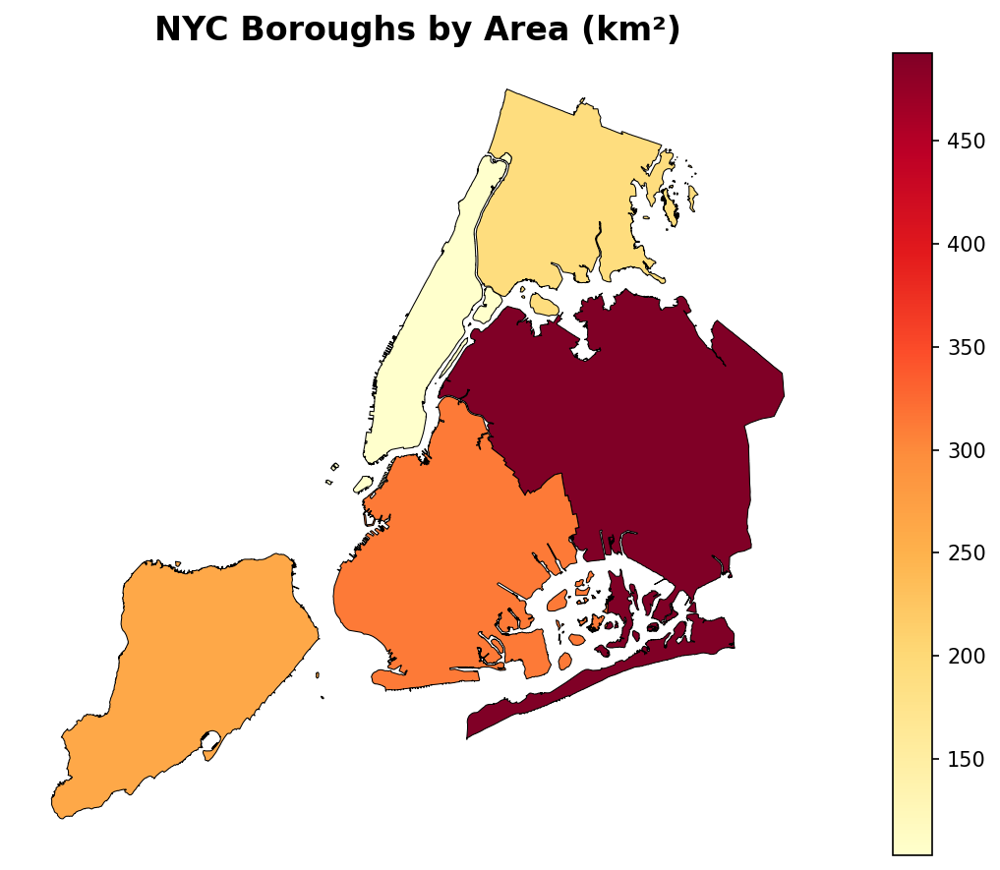

In [24]:
# Create a choropleth map showing borough areas
fig, ax = plt.subplots(figsize=(10, 6))

gdf.plot(
    column="area_km2",
    ax=ax,
    legend=True,
    cmap="YlOrRd",  # Yellow-Orange-Red colormap
    edgecolor="black",
    linewidth=0.5,
)

plt.title("NYC Boroughs by Area (km²)", fontsize=16, fontweight="bold")
plt.axis("off")  # Remove coordinate axes for cleaner appearance
plt.tight_layout()
plt.show()

### Multi-Layer Visualization

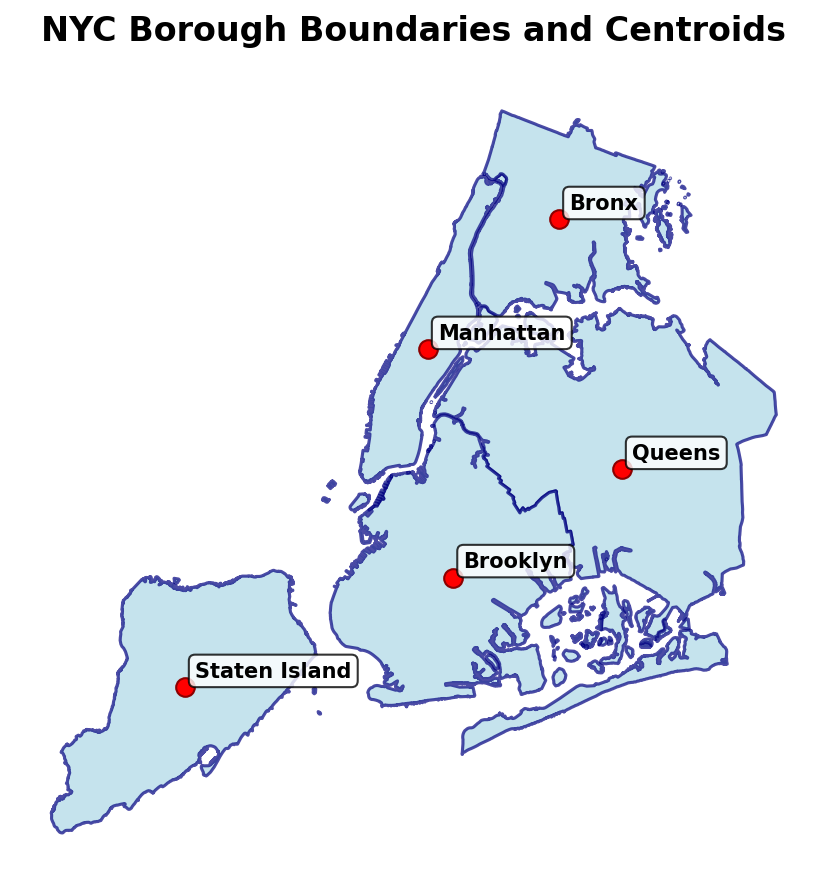

In [25]:
# Create a comprehensive map with multiple layers
fig, ax = plt.subplots(figsize=(10, 6))

# Plot borough boundaries as base layer
gdf["geometry"].plot(
    ax=ax, color="lightblue", edgecolor="navy", linewidth=1.5, alpha=0.7
)

# Add centroids as point layer
gdf["centroid"].plot(
    ax=ax, color="red", markersize=80, edgecolor="darkred", linewidth=1
)

# Add borough labels
for idx, row in gdf.iterrows():
    # Get centroid coordinates for label placement
    x = row.centroid.x
    y = row.centroid.y
    ax.annotate(
        idx,
        (x, y),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=10,
        fontweight="bold",
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
    )

plt.title("NYC Borough Boundaries and Centroids", fontsize=16, fontweight="bold")
plt.axis("off")
plt.tight_layout()
plt.show()

### Interactive Visualization

In [26]:
# Create an interactive map using Folium integration
m = gdf.explore(
    column="area_km2",
    cmap="YlOrRd",
    tooltip=["area_km2", "distance_to_manhattan_km"],
    popup=True,
    legend=True,
)
m

## Advanced Geometric Operations

### Buffer Analysis

In [27]:
# Create 3-kilometer buffer zones around each borough
buffer_distance = 3000  # meters
gdf["buffered"] = gdf.buffer(buffer_distance)

print(f"Created {buffer_distance/1000} km buffer zones around each borough")

Created 3.0 km buffer zones around each borough


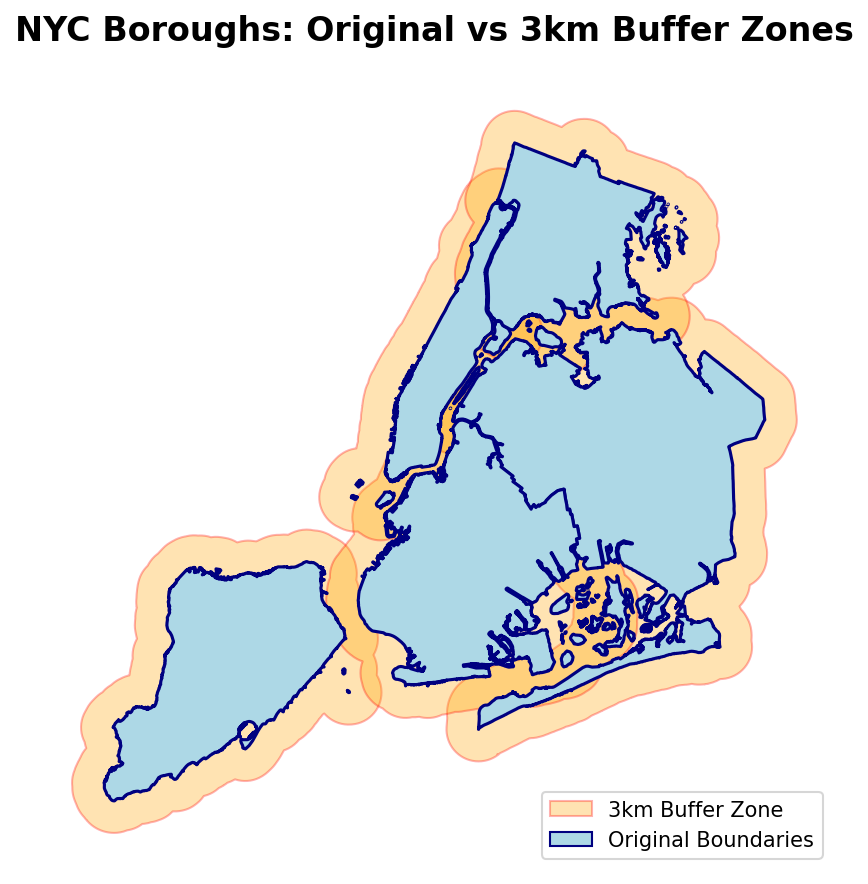

In [33]:
import matplotlib.patches as mpatches

# Visualize original vs buffered geometries
fig, ax = plt.subplots(figsize=(10, 6))

# Plot buffered areas first (background)
gdf["buffered"].plot(
    ax=ax,
    alpha=0.3,
    color="orange",
    edgecolor="red",
    linewidth=1,
)

# Plot original geometries on top
gdf["geometry"].plot(
    ax=ax,
    color="lightblue",
    edgecolor="navy",
    linewidth=1.5,
)

# Create custom legend handles, explicitly setting facecolor and edgecolor
buffered_patch = mpatches.Patch(facecolor='orange', alpha=0.3, edgecolor='red', label='3km Buffer Zone')
original_patch = mpatches.Patch(facecolor='lightblue', edgecolor='navy', label='Original Boundaries')

plt.title("NYC Boroughs: Original vs 3km Buffer Zones", fontsize=16, fontweight="bold")
plt.legend(handles=[buffered_patch, original_patch], loc="lower right") # Changed legend location
plt.axis("off")
plt.tight_layout()
plt.show()

### Convex Hull Analysis

In [ ]:
# Calculate convex hulls for each borough
gdf["convex_hull"] = gdf.convex_hull

# Compare areas between original shapes and convex hulls
gdf["convex_hull_area"] = gdf["convex_hull"].area / 1_000_000  # Convert to km²
gdf["area_ratio"] = gdf["convex_hull_area"] / gdf["area_km2"]

print("Convex Hull Analysis:")
print(gdf[["area_km2", "convex_hull_area", "area_ratio"]].round(2))

In [ ]:
# Create comparison visualization
fig, ax = plt.subplots(figsize=(10, 6))

# Plot original geometries
gdf["geometry"].plot(
    ax=ax, color="lightblue", edgecolor="navy", linewidth=2, label="Original Shape"
)

# Plot convex hulls as outlines
gdf["convex_hull"].plot(
    ax=ax,
    facecolor="none",
    edgecolor="red",
    linewidth=2,
    linestyle="--",
    label="Convex Hull",
)

plt.title(
    "NYC Boroughs: Original Shapes vs Convex Hulls", fontsize=16, fontweight="bold"
)
plt.legend(loc="upper right")
plt.axis("off")
plt.tight_layout()
plt.show()

## Spatial Relationships and Queries

### Intersection Analysis

In [ ]:
# Test which buffered boroughs intersect with Manhattan's original boundary
manhattan_geom = gdf.loc["Manhattan", "geometry"]

gdf["intersects_manhattan"] = gdf["buffered"].intersects(manhattan_geom)
gdf["touches_manhattan"] = gdf["geometry"].touches(manhattan_geom)

# Display results
intersection_results = gdf[["intersects_manhattan", "touches_manhattan"]]
intersection_results

### Containment and Spatial Validation

In [ ]:
# Verify that centroids fall within their respective borough boundaries
gdf["centroid_within_borough"] = gdf["centroid"].within(gdf["geometry"])

# Check for any anomalies
anomalies = gdf[~gdf["centroid_within_borough"]]
if len(anomalies) > 0:
    print("Warning: Some centroids fall outside their borough boundaries")
    print(anomalies.index.tolist())
else:
    print("✓ All centroids correctly fall within their borough boundaries")

## Best Practices and Performance Considerations

### Coordinate System Management

### Memory and Performance

### Data Validation

## Key Takeaways

## Exercises

### Exercise 1: Creating and Manipulating GeoDataFrames with GeoPandas

### Exercise 2: Combining NumPy, Pandas, and GeoPandas